In [1]:
import pandas as pd
import numpy as np
from glob import glob
import tskit
import sys
sys.path.append("/Users/jameskitchens/Documents/GitHub/terracotta")
import terracotta as tct
import importlib
importlib.reload(tct)
import matplotlib.pyplot as plt


def ancestors(tree, u):
    """Find all of the ancestors above a node for a tree

    Taken directly from https://github.com/tskit-dev/tskit/issues/2706

    Parameters
    ----------
    tree : tskit.Tree
    u : int
        The ID for the node of interest

    Returns
    -------
    An iterator over the ancestors of u in this tree
    """

    u = tree.parent(u)
    while u != -1:
         yield u
         u = tree.parent(u)

directory = "."

demes = pd.read_csv(f"{directory}/demes.tsv", sep="\t")
demes["type"] = 0 #ignoring elevation type
samples = pd.read_csv(f"{directory}/samples.tsv", sep="\t")
world_map = tct.WorldMap(demes, samples)
trees = [tskit.load(ts).first() for ts in glob(f"../hexagonal_world_map/trees/*")]

locations = tct.locate_nodes_in_tree(
    world_map=world_map,
    tree=trees[10],
    migration_rates={0:0.02082344}
)



#sample = 0
#lineage = ancestors(trees[10], sample)
#world_map.draw_estimated_location(location_vector=locations[sample], figsize=(15,15))
#for ancestor in lineage:
#    world_map.draw_estimated_location(location_vector=np.log(locations[ancestor]), figsize=(15,15))#, show_samples=list(trees[0].leaves(ancestor)))

Precalculating transitions...


In [36]:
sys.path.append("/Users/jameskitchens/Documents/GitHub/tskit_arg_visualizer")
import tskit_arg_visualizer as tsviz

lineage = ancestors(trees[10], 1500)
times = [0]
for node in lineage:
    times.append(int(trees[10].time(node)))


ts = tskit.load(glob(f"../hexagonal_world_map/trees/*")[10])
d3arg = tsviz.D3ARG.from_ts(ts=ts)
d3arg.draw_nodes([1500, 2032, 2456, 2699], degree=100)

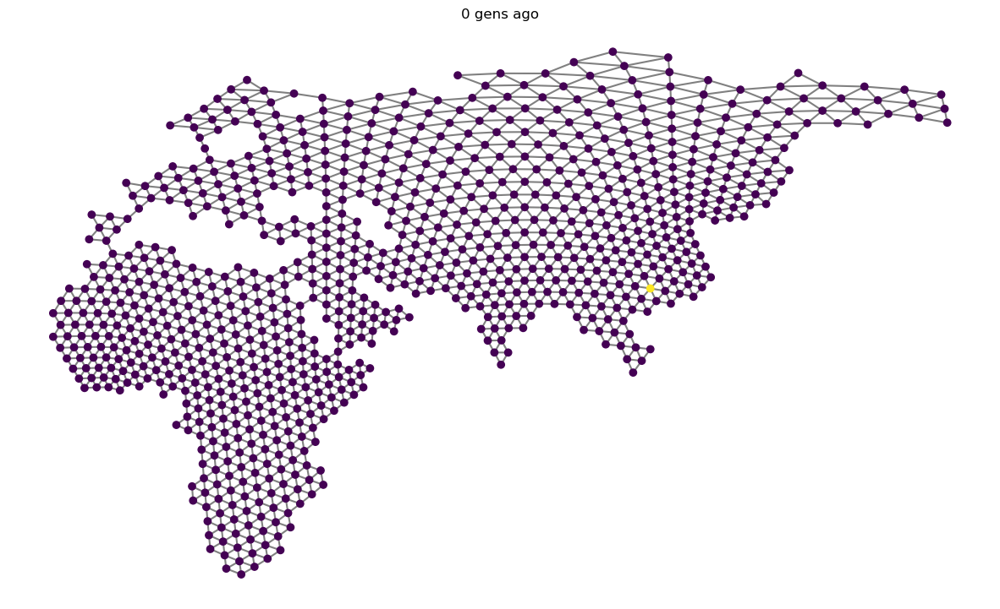

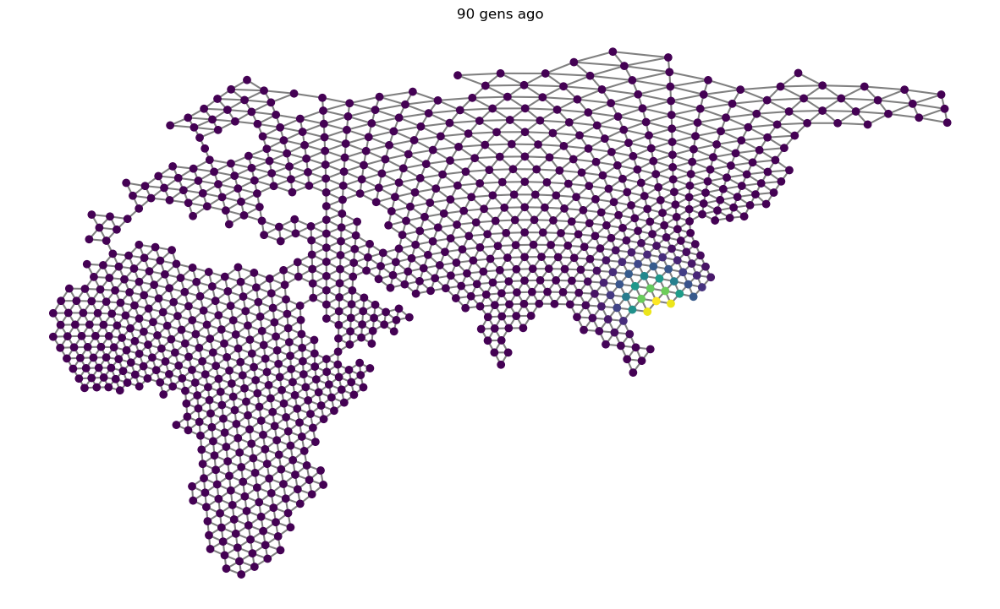

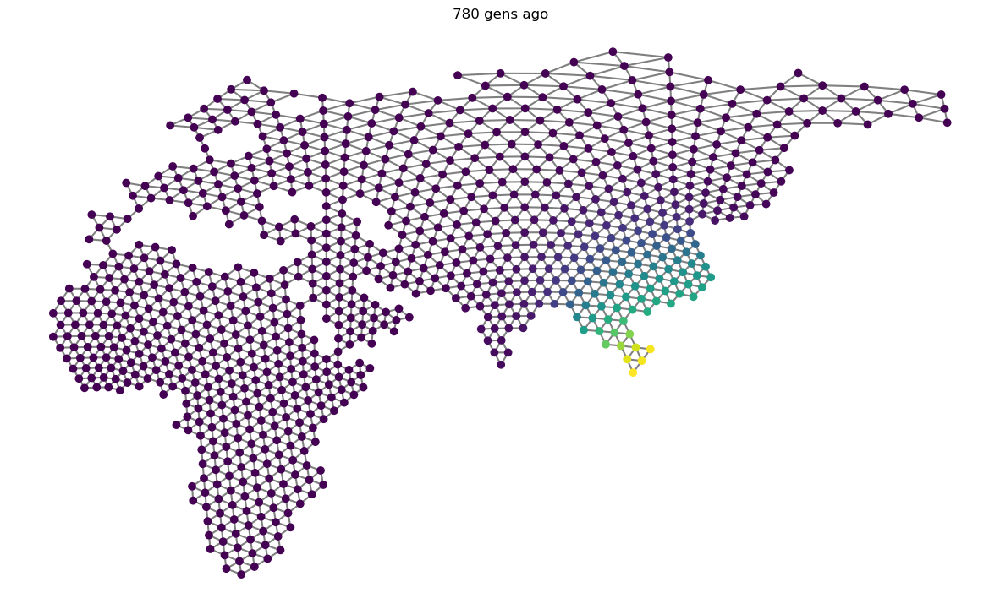

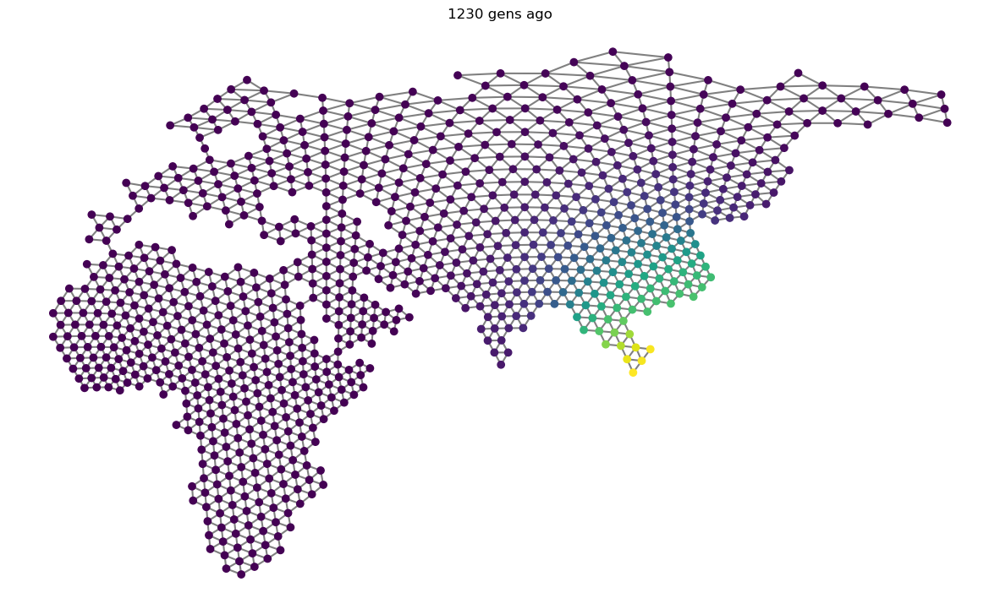

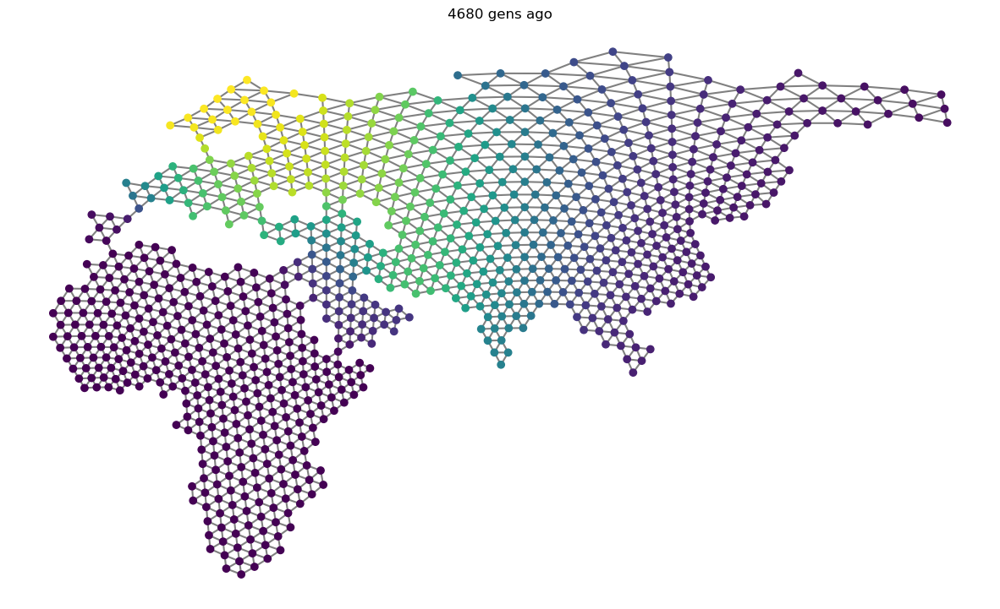

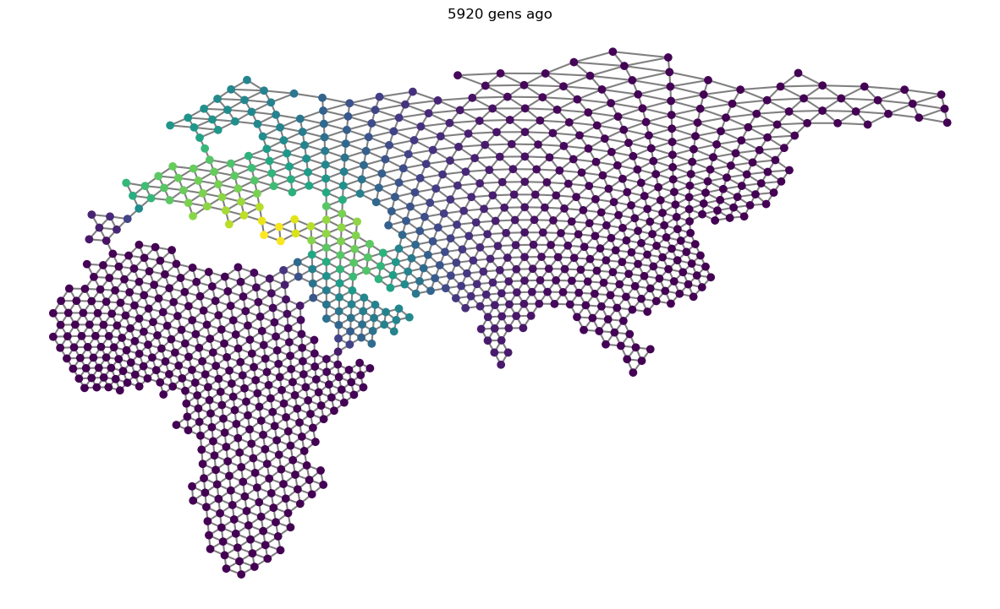

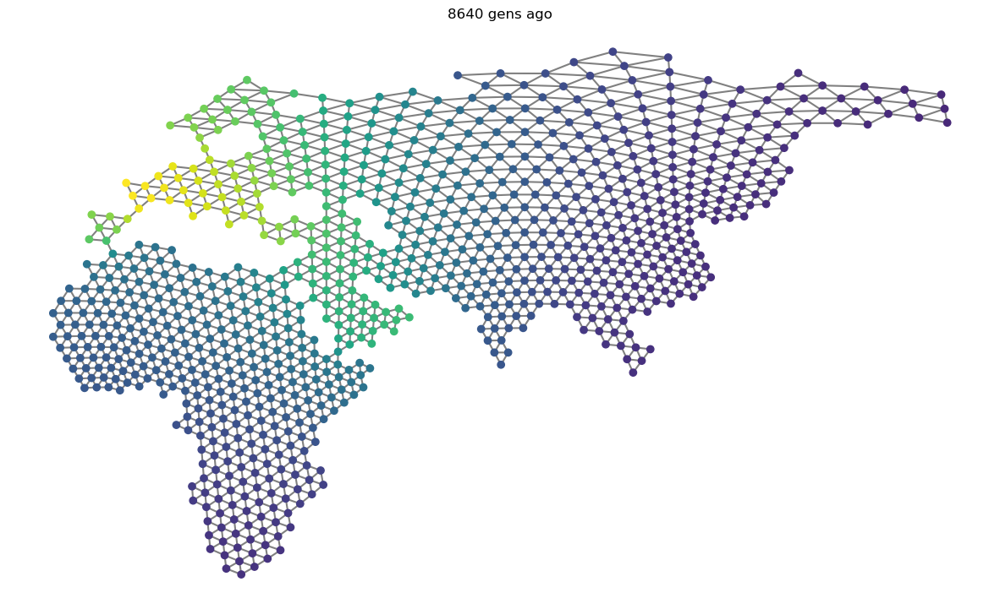

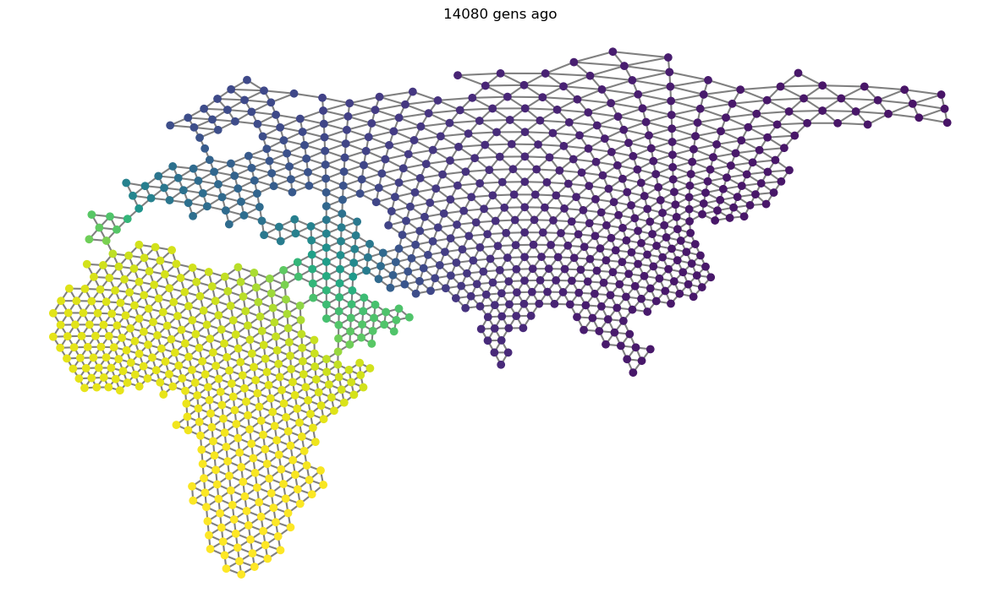

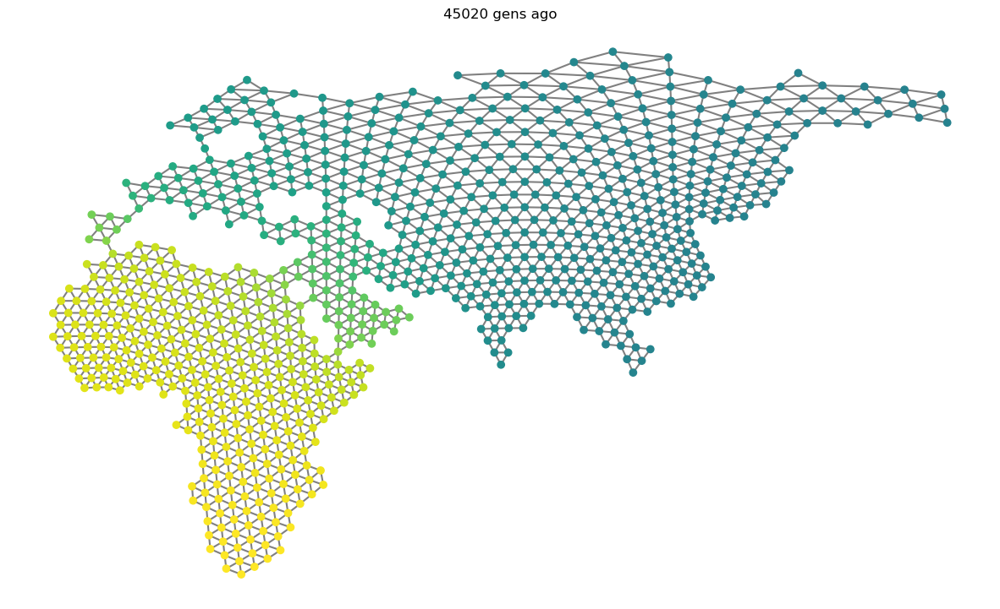

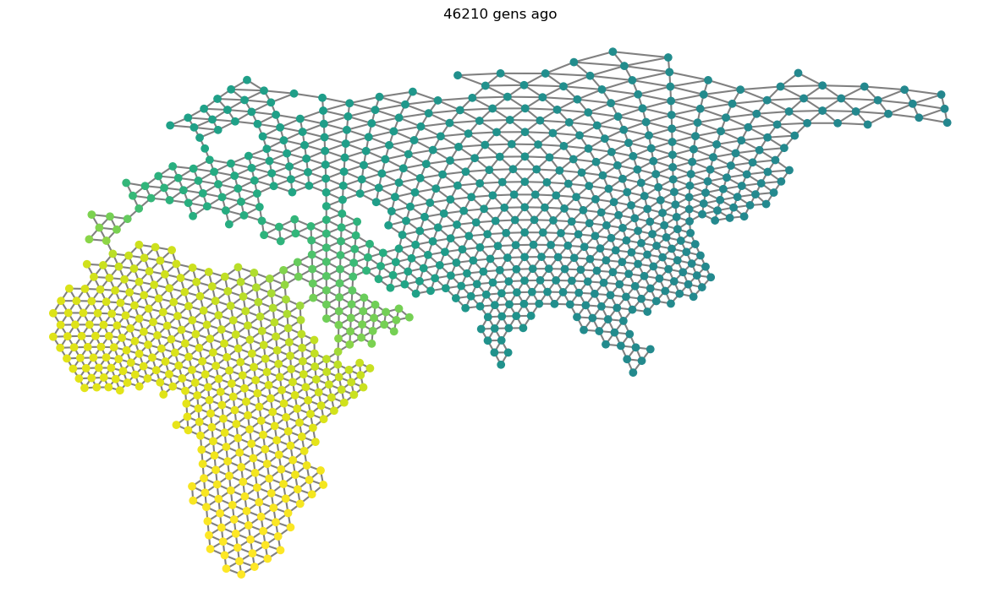

In [6]:
sample = 1500
tree = 10
lineage = ancestors(trees[tree], sample)
world_map.draw_estimated_location(location_vector=locations[sample], figsize=(15,15), save_to=f"{sample}_{sample}_{tree}.png", title=f"{int(trees[tree].time(sample))} gens ago")
for ancestor in lineage:
    world_map.draw_estimated_location(location_vector=locations[ancestor], figsize=(15,15), save_to=f"{sample}_{ancestor}_{tree}.png", title=f"{int(trees[tree].time(ancestor))} gens ago")#, show_samples=list(trees[0].leaves(ancestor)))

In [7]:
demes = pd.read_csv(f"{directory}/demes.tsv", sep="\t")
samples = pd.read_csv(f"{directory}/samples.tsv", sep="\t")
world_map = tct.WorldMap(demes, samples)
trees = [tskit.load(ts).first() for ts in glob(f"{directory}/trees/*")]

locations_elev = tct.locate_nodes_in_tree(
    world_map=world_map,
    tree=trees[10],
    migration_rates={
        0:0.021673,
        1:0.021673,
        2:0.021673,
        3:0.021673,
        4:0.00001,
        5:0.021673,
        6:0.021673,
        7:0.021673,
        8:0.00001,
        9:0.021673,
        10:0.021673,
        11:0.00001,
        12:0.021673,
        13:0.00001,
        14:0.00001
    }
)

Precalculating transitions...


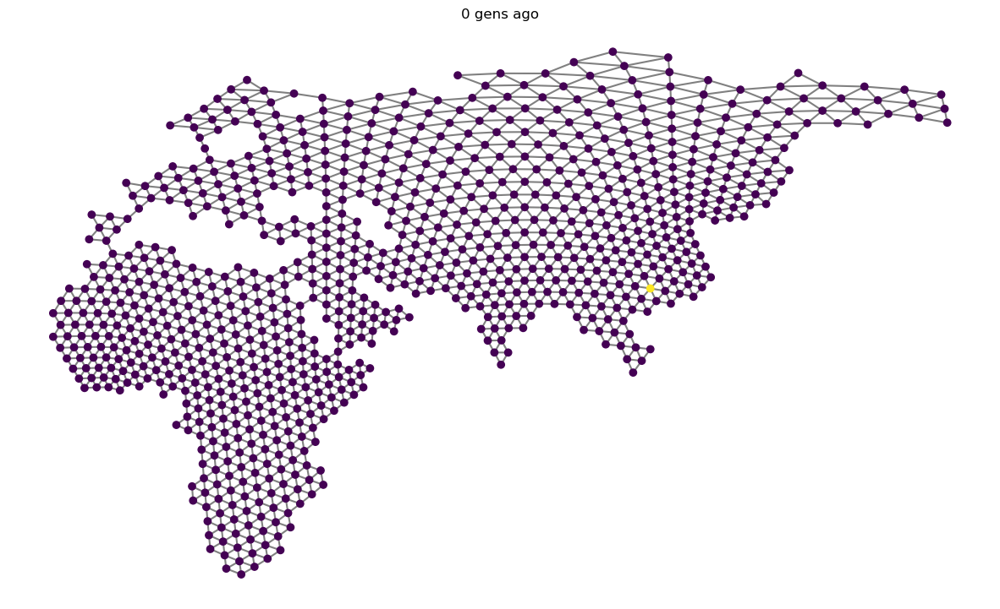

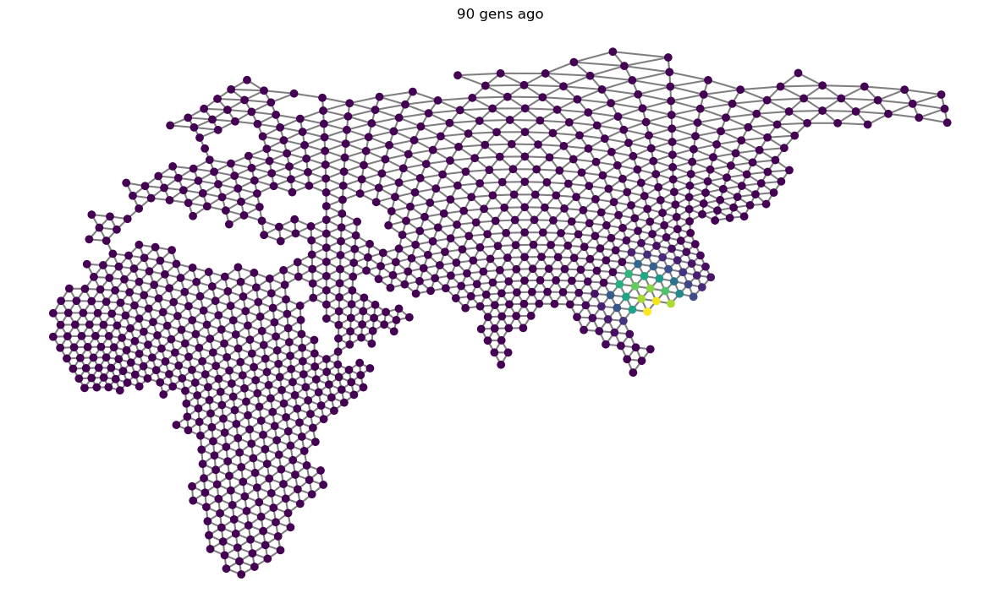

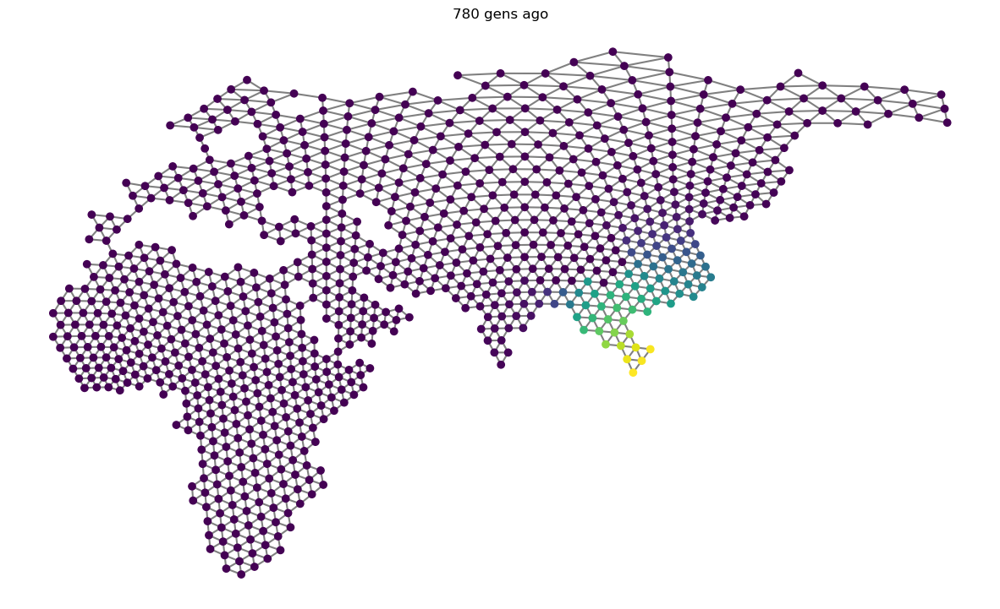

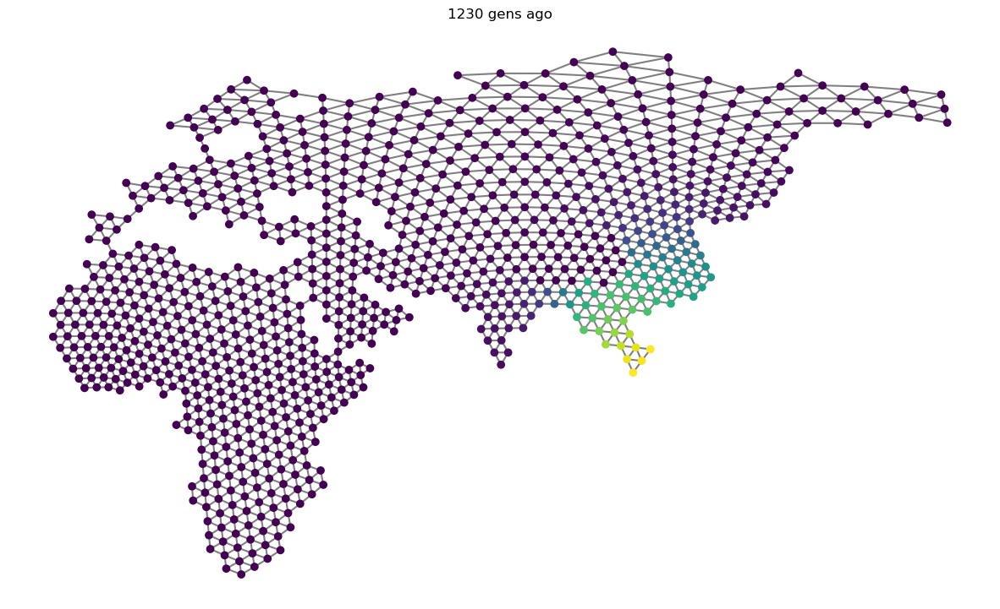

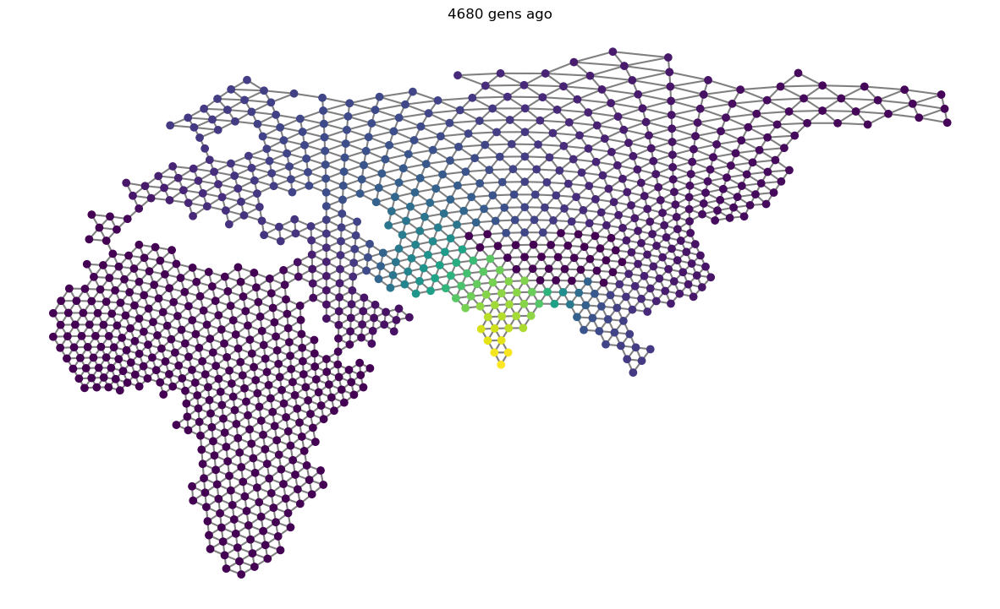

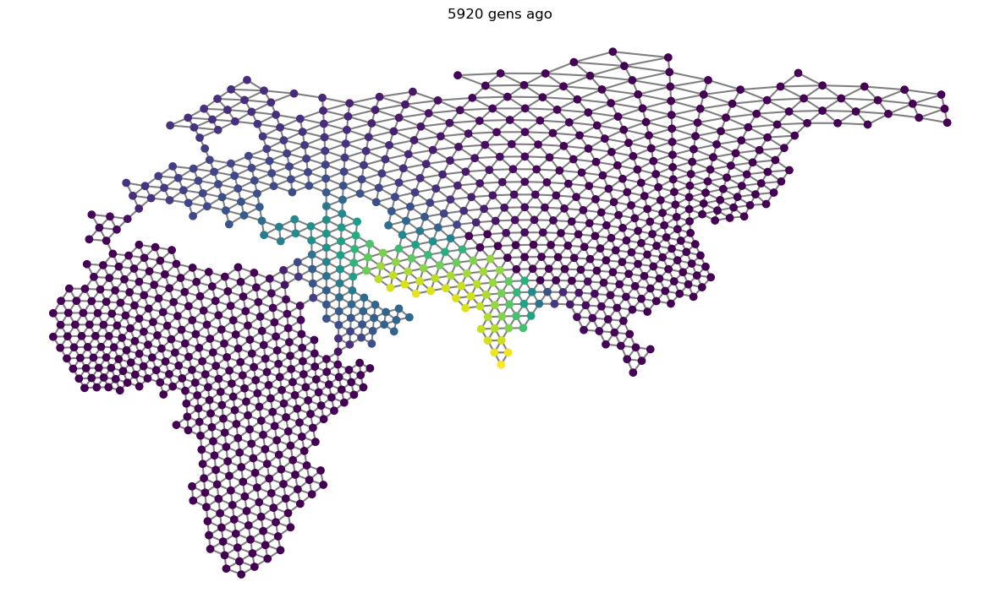

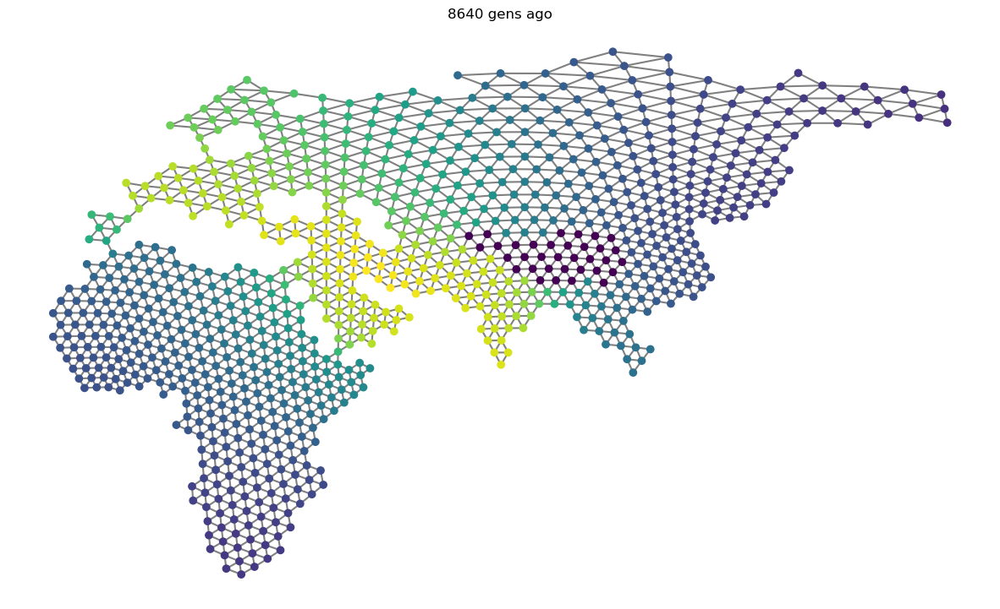

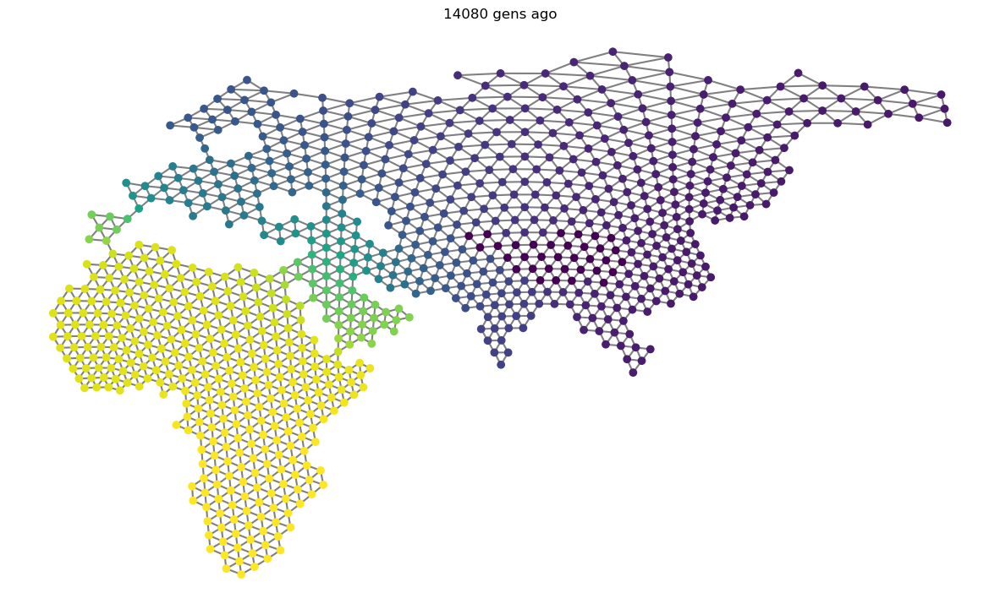

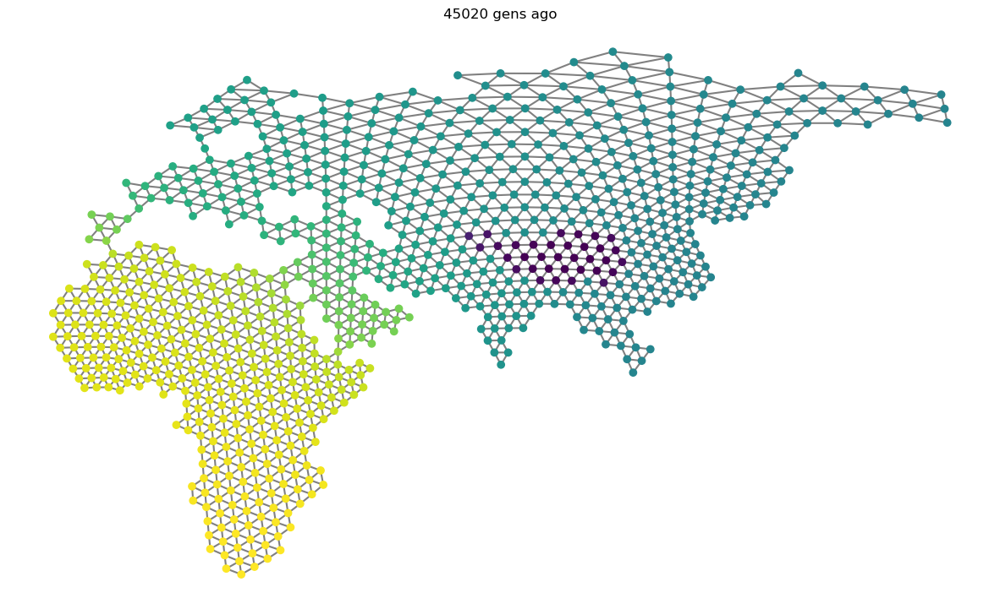

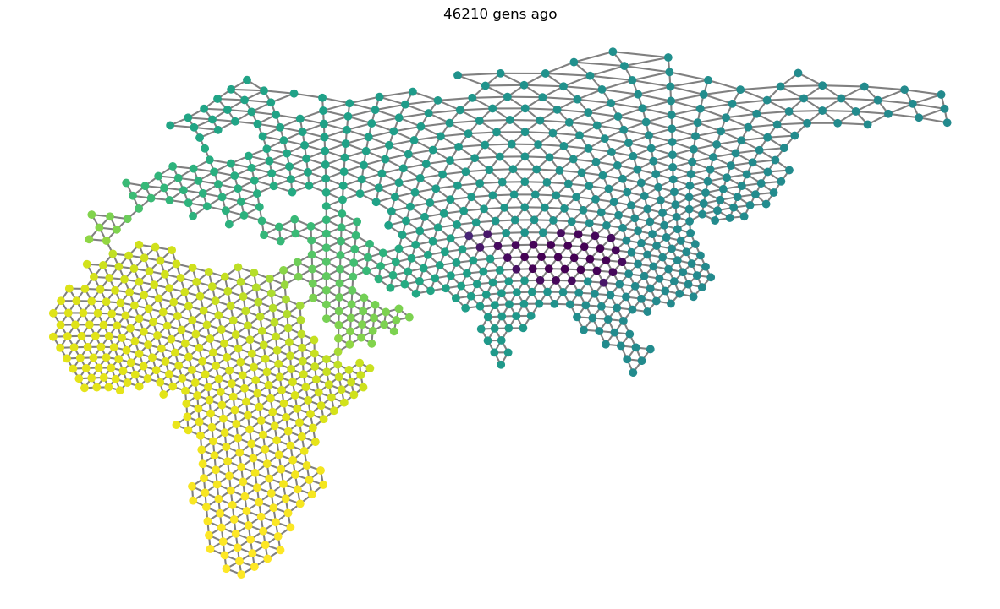

In [8]:
sample = 1500
lineage = ancestors(trees[10], sample)
world_map.draw_estimated_location(location_vector=locations_elev[sample], figsize=(15,15), save_to=f"himalayas_{sample}_{sample}_{tree}.png", title=f"{int(trees[tree].time(sample))} gens ago")
for ancestor in lineage:
    world_map.draw_estimated_location(location_vector=locations_elev[ancestor], figsize=(15,15), save_to=f"himalayas_{sample}_{ancestor}_{tree}.png", title=f"{int(trees[tree].time(ancestor))} gens ago")#, show_samples=list(trees[0].leaves(ancestor)))

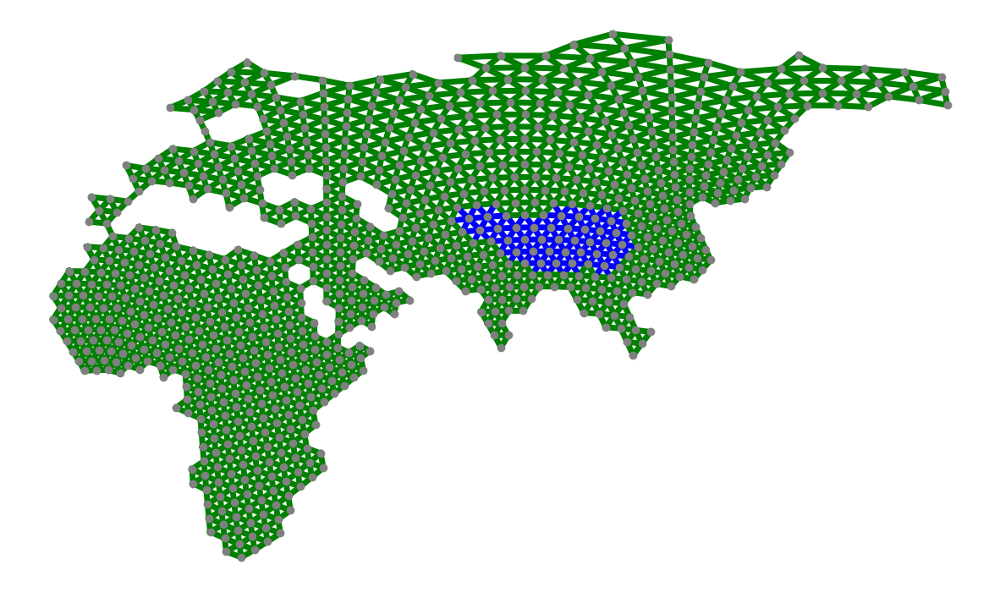

In [10]:
world_map.draw(
    figsize=(15,15),
    color_connections=True,
    migration_rates={
        0:0.021673,
        1:0.021673,
        2:0.021673,
        3:0.021673,
        4:0.00001,
        5:0.021673,
        6:0.021673,
        7:0.021673,
        8:0.00001,
        9:0.021673,
        10:0.021673,
        11:0.00001,
        12:0.021673,
        13:0.00001,
        14:0.00001
    },
    save_to="himalayas_migration_rate.png"
)